In [40]:
##My import cell
%matplotlib inline
import re
import requests
import textblob
import string
from datetime import *
import random
from scipy.misc import imread
from wordcloud import *
import os
import numpy as np
from collections import Counter
import pandas as pd
import networkx as nx
from matplotlib import pyplot
import matplotlib.pyplot as plt
import plotly as py
import seaborn as sbn
import math
from nltk.corpus import stopwords
import textatistic
from bs4 import BeautifulSoup
from subprocess import check_output
matplotlib.style.use('ggplot')
import psycopg2
py.offline.init_notebook_mode()

In [2]:
opt = pd.read_csv('/home/faculty/millbr02/pub/ecomm/order_products__train.csv')
products = pd.read_csv('/home/faculty/millbr02/pub/ecomm/products.csv')

In [3]:
msk = np.random.rand(len(opt)) < 0.8
train = opt[msk]
test = opt[~msk]

In [5]:
aco = train.groupby('order_id')
aco.get_group(36)['product_id']

8     39612
9     19660
10    49235
12    46620
13    34497
14    48679
15    46979
Name: product_id, dtype: int64

In [6]:
unique_orderids = aco.groups.keys()

In [7]:
%%time
iimat = {}
for oid in unique_orderids:
    for product1 in aco.get_group(oid)['product_id']:
        if int(product1) not in iimat:
            iimat[int(product1)] = {}
        for product2 in aco.get_group(oid)['product_id']:
            if product1 != product2:
                iimat[int(product1)][int(product2)] = iimat[int(product1)].get(int(product2),0) +1

CPU times: user 8min 7s, sys: 1.6 s, total: 8min 9s
Wall time: 8min 9s


In [8]:
%%time
msofar = 0
ones =0
for key in iimat:
    for i in iimat[key]:
        if iimat[key][i]==1:
            ones += 1
        if iimat[key][i] > msofar:
            msofar = iimat[key][i]
            print(key,i,msofar)

1 30720 2
1 31759 3
1 6184 8
1 39657 9
10 4138 18
34 21137 26
34 13176 36
45 26209 46
45 24852 122
260 24852 205
260 21137 211
432 24852 250
4605 21903 345
4605 47626 481
4605 24852 692
4920 24852 746
13176 39275 769
13176 47209 1546
13176 21137 1927
CPU times: user 3.84 s, sys: 40 ms, total: 3.88 s
Wall time: 3.87 s


In [15]:
delkeys = []
for i in iimat.keys():
    for k,v in iimat[i].items():
        if v == 1:
            delkeys.append((i,k))

In [16]:
for i, j in delkeys:
    del iimat[i][j]

In [17]:
import json
with open('item_item.json', 'w') as f:
    json.dump(iimat,f)

In [18]:
new_cat = pd.read_json('/home/faculty/millbr02/pub/item_item.json')
new_cat.head()

,1,10,100,1000,10000,10001,10005,10006,10008,10009,...,9985,9986,9989,999,9990,9993,9995,9996,9997,9998
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
def getval(d):
    return d[1]

recs = sorted(new_cat[13176].items(), key=getval, reverse=True)

In [22]:
def predictor(mat, item1, item2):
    recs = list(mat[item1].items()) + list(mat[item2].items())
    recs = sorted(recs, key=getval, reverse=True)
    recs = [recs[x][0] for x in range(min(5,len(recs)))]
    recs = list(set(recs))
    return recs

In [23]:
for p in predictor(new_cat,13176,21137):
    print(products[products.product_id == p].product_name)

19271    Veganic Sprouted Brown Rice Cacao Crisps
Name: product_name, dtype: object
10007    Sheeps Milk Maple Yogurt
Name: product_name, dtype: object
10010    Baby Diapers Size 2
Name: product_name, dtype: object
10004    Potstickers, Organic, Pork & Vegetable
Name: product_name, dtype: object
10016    Tilapia Filet
Name: product_name, dtype: object


In [25]:
test = pd.read_csv('/home/faculty/millbr02/pub/mytest.csv')
tco = train.groupby('order_id')

In [26]:
##gives us the our percent correct

hits = 0
count = 0
for order in tco.groups.keys():
    contents = list(tco.get_group(order).sort_values('add_to_cart_order').product_id)
    if len(contents) > 2:
        count += 1
        recs = predictor(iimat, contents[0], contents[1])
        basket = set(contents[3:])
        recs = set(recs)
        correct_recs = recs.intersection(basket)
        if len(correct_recs) >= 1:
            hits += 1
            
            
print(hits, count, hits/count)

24954 110797 0.22522270458586424


In [27]:
prod_train = products.merge(opt).sort_values(by='order_id').reset_index(drop=True)
new_df = prod_train.set_index(["order_id"]).reset_index()
df_group = new_df.groupby('order_id')

In [28]:
df_group.get_group(1).sort_values(by='add_to_cart_order').reset_index(drop=True)

,order_id,product_id,product_name,aisle_id,department_id,add_to_cart_order,reordered
0,1,49302,Bulgarian Yogurt,120,16,1,1
1,1,11109,Organic 4% Milk Fat Whole Milk Cottage Cheese,108,16,2,1
2,1,10246,Organic Celery Hearts,83,4,3,0
3,1,49683,Cucumber Kirby,83,4,4,0
4,1,43633,Lightly Smoked Sardines in Olive Oil,95,15,5,1
5,1,13176,Bag of Organic Bananas,24,4,6,0
6,1,47209,Organic Hass Avocado,24,4,7,0
7,1,22035,Organic Whole String Cheese,21,16,8,1


In [31]:
%%time
a2a = {}
for i in list(set(new_df.order_id)):

    new_df_group = df_group.get_group(i).sort_values(by='add_to_cart_order').reset_index(drop=True)

    aisles_list = list(new_df_group.aisle_id)#grouped_object.get_group(i).sort_values(by='add_to_cart_order').reset_index(drop=True).aisle_id)

    for item in list(zip(aisles_list,aisles_list[1:])):
        if item[0] not in a2a:
            a2a[item[0]] = {item[1]:1}
        else:
            if item[1] not in a2a[item[0]]:
                a2a[item[0]][item[1]] = 1
            else:
                a2a[item[0]][item[1]] += 1

CPU times: user 2min 22s, sys: 452 ms, total: 2min 23s
Wall time: 2min 22s


In [33]:
##NO NAN
best_df = pd.DataFrame(a2a).fillna(0)

In [34]:
best_df.head()

,1,2,3,4,5,6,7,8,9,10,...,125,126,127,128,129,130,131,132,133,134
1,188.0,5.0,34.0,21.0,6.0,6.0,4.0,7.0,16.0,0.0,...,2.0,2.0,1.0,16.0,19.0,15.0,12.0,0.0,1.0,0.0
2,12.0,134.0,23.0,21.0,6.0,2.0,9.0,3.0,44.0,2.0,...,2.0,0.0,2.0,28.0,24.0,8.0,55.0,1.0,2.0,2.0
3,23.0,19.0,4483.0,85.0,13.0,17.0,8.0,13.0,75.0,0.0,...,44.0,11.0,11.0,41.0,67.0,76.0,59.0,1.0,5.0,0.0
4,18.0,28.0,78.0,1164.0,41.0,11.0,17.0,10.0,116.0,3.0,...,10.0,7.0,13.0,52.0,110.0,45.0,132.0,1.0,9.0,1.0
5,6.0,12.0,21.0,42.0,91.0,5.0,6.0,2.0,41.0,2.0,...,0.0,0.0,2.0,24.0,31.0,10.0,25.0,0.0,2.0,0.0


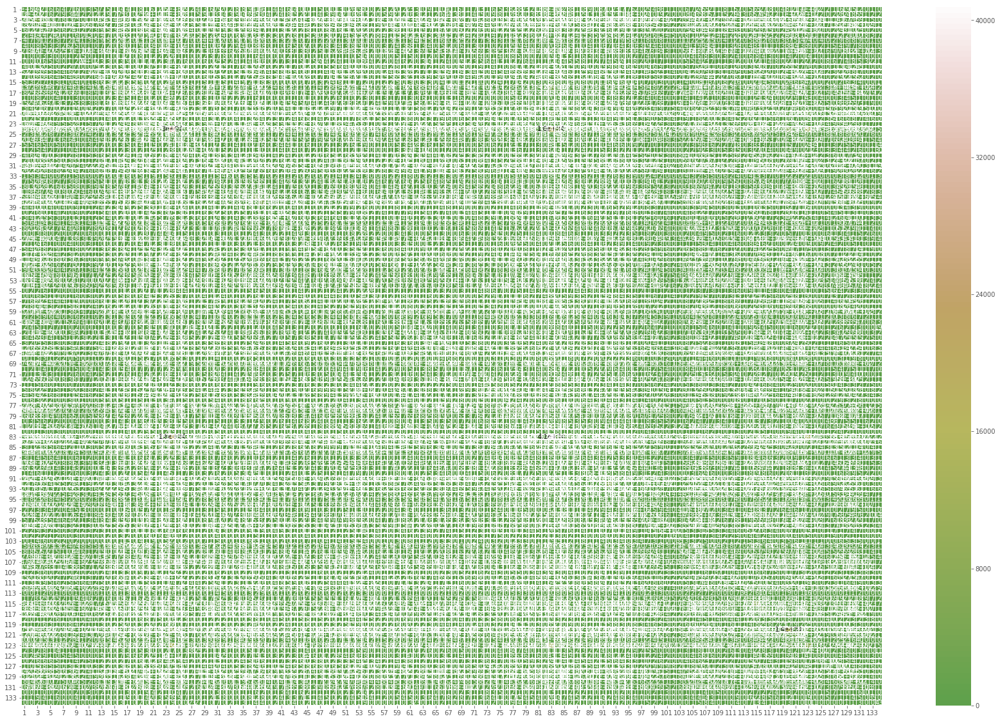

In [46]:
a4_dims = (30, 20)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sbn.heatmap(best_df, vmin=0,center=0, annot=True, linewidths=.5, cmap="gist_earth")

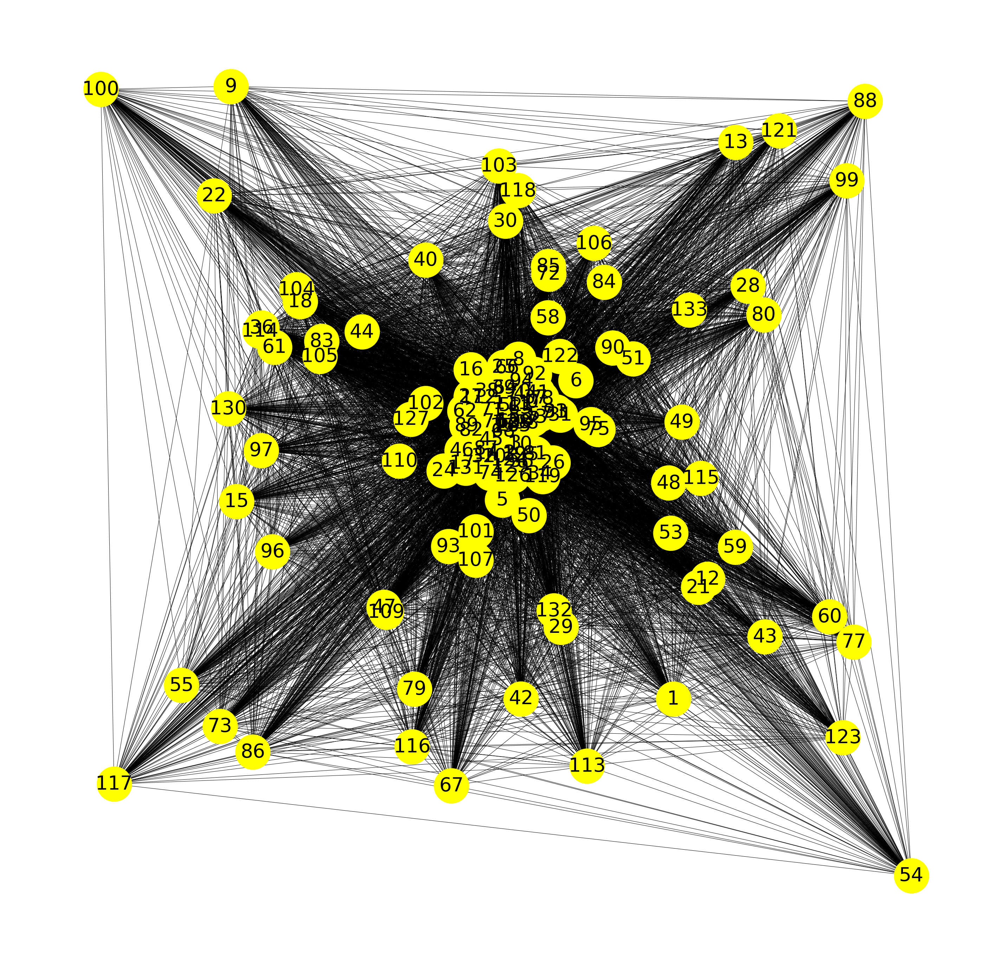

In [49]:
#network graph
A=np.matrix(best_df)
G=nx.from_numpy_matrix(A)
G.edges(data=True)
Gfig, gax = plt.subplots(figsize = (50,50))
nx.draw(G,nx.spring_layout(G, iterations=5), ax=gax, with_labels=True, node_size=10000, node_color='yellow', font_size = 55)